# Spatial validation: Satellite vs Reconstructed sea ice concentration

Katie Brennan  
September 2020 

In [1]:
import sys,os,copy

In [2]:
import sys
import numpy as np
import xarray as xr

from scipy import stats
from scipy import signal

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point

In [3]:
sys.path.insert(1,'/home/disk/p/mkb22/Documents/si_analysis_kb/instrumental_assimilation_experiments/')
import reanalysis_recons_utils as rrutils

sys.path.insert(1,'/home/disk/kalman2/mkb22/pyLMR/')
import LMR_utils as lmr

sys.path.insert(1,'/home/disk/p/mkb22/Documents/si_utils_kb/')
import Sice_utils as siutils  
import stats_utils as kbstats

sys.path.insert(1,'/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/')
import commonera_utils as ce_utils 

Loading information from datasets.yml
Loading information from grid_def.yml
Loading information from datasets.yml
Loading information from grid_def.yml


In [4]:
plt.rcParams['figure.dpi']=200

In [5]:
import importlib
# #importlib.reload(LMRlite)
# #importlib.reload(LMR_config)
# importlib.reload(LMRlite)
importlib.reload(ce_utils)

<module 'commonera_utils' from '/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/commonera_utils.py'>

In [6]:
def sub_arctic_plot_contourf(fig,ax,VAR1,LAT,LON,TITLE1,levels,labels=None,colorbar=True,extent=True):
    if labels is None: 
        print('taking labels from levels')
        labels = levels
    
    var1, lon1 = add_cyclic_point(VAR1, coord=LON)
    new_lon2d, new_lat2d = np.meshgrid(lon1, LAT)
    if extent is True: 
        ax.set_extent([-150, 140, 50, 90], crs=ccrs.PlateCarree())
    ax.gridlines(linestyle='--')
    ax.add_feature(cfeature.LAND, facecolor=(1, 1, 1))
    cs = ax.contourf(new_lon2d, new_lat2d, var1, 
                     levels=levels, cmap=plt.cm.RdBu_r, 
                     transform=ccrs.PlateCarree())
    ax.coastlines(resolution='110m', linewidth=0.5)
    if colorbar is True:
        plt.colorbar(cs, ax=ax, ticks=labels, label='%')
    ax.set_title(TITLE1)
    
    return cs

In [7]:
def sub_arctic_plot(fig,ax,VAR1,LAT,LON,TITLE1,MAX1,colorbar=True,extent=True):
    var1, lon1 = add_cyclic_point(VAR1, coord=LON)
    new_lon2d, new_lat2d = np.meshgrid(lon1, LAT)
    if extent is True: 
        ax.set_extent([-150, 140, 50, 90], crs=ccrs.PlateCarree())
    ax.gridlines(linestyle='--')
    ax.add_feature(cfeature.LAND, facecolor=(1,1,1))
    cs = ax.pcolormesh(new_lon2d, new_lat2d, var1, 
                       vmin=-MAX1, vmax=MAX1, cmap=plt.cm.RdBu_r, 
                       transform=ccrs.PlateCarree())
    ax.coastlines(resolution='110m', linewidth=0.5)
    if colorbar is True:
        plt.colorbar(cs, ax=ax)
    ax.set_title(TITLE1)
    
    return cs

In [8]:
np.arange(-100,100.01,20)

array([-100.,  -80.,  -60.,  -40.,  -20.,    0.,   20.,   40.,   60.,
         80.,  100.])

In [9]:
proj = dict(projection=ccrs.Stereographic(central_latitude=90,
                                          central_longitude=-45,
                                          true_scale_latitude=0.1))

In [10]:
def load_ccsm4_lm_regridded():
    ccsm4_dir = '/home/disk/chaos/mkb22/Documents/SeaIceData/CCSM4/CCSM4_last_millennium/'
    ccsm4_file = 'ccsm4_sic_sit_tas_20CRv2_850_1850_full.npz'

    ccsm4_lm = np.load(ccsm4_dir+ccsm4_file)

    ccsm4_truth_sic = ccsm4_lm['sic_ccsm4']
    ccsm4_truth_sit = ccsm4_lm['sit_ccsm4']
    ccsm4_truth_tas = ccsm4_lm['tas_ccsm4']
    ccsm4_truth_lat = ccsm4_lm['lat_ccsm4']
    ccsm4_truth_lon = ccsm4_lm['lon_ccsm4']
    
    return ccsm4_truth_tas, ccsm4_truth_sic, ccsm4_truth_sit, ccsm4_truth_lat, ccsm4_truth_lon

In [11]:
[ccsm4_truth_tas, ccsm4_truth_sic, 
 ccsm4_truth_sit,
 ccsm4_truth_lat, ccsm4_truth_lon] = load_ccsm4_lm_regridded()

ccsm4_truth_time = np.arange(850,1851,1)

ccsm4_sic_mnstate = np.nanmean(ccsm4_truth_sic,axis=0)

In [12]:
ccsm4_truth_sic.shape

(1001, 91, 180)

## Load recon: 

In [13]:
output_dir_ccsm4 = '/home/disk/p/mkb22/nobackup/LMR_output/common_era_experiments/experiments/ccsm4/'
output_file_ccsm4 = 'sic_ccsm4_anrecon_0_2000_pages2kv2_inf2_6_loc15000_iter0.pkl'

niter = 10

[sic_lalo_allit_ccsm4, tas_lalo_allit_ccsm4, sic_ens_var_allit_ccsm4, 
 nobs_allit_ccsm4, sia_ens_allit_ccsm4, sie_ens_allit_ccsm4, Ye_assim_allit_ccsm4, 
 Ye_assim_coords_allit_ccsm4, Xb_inflate_allit_ccsm4, recon_years_ccsm4, 
 proxy_assim_loc_allit_ccsm4] = ce_utils.load_recon_allit(output_dir_ccsm4,output_file_ccsm4,niter)

In [36]:
sia_ens_allit_ccsm4.shape, sie_ens_allit_ccsm4.shape, sic_lalo_allit_ccsm4.shape

((2000, 200, 10), (2000, 200, 10), (2000, 91, 180, 10))

In [14]:
output_dir_mpi = '/home/disk/p/mkb22/nobackup/LMR_output/common_era_experiments/experiments/mpi/'
output_file_mpi = 'sic_mpi_anrecon_0_2000_pages2kv2_inf1_8_loc15000_iter0.pkl'

[sic_lalo_allit_mpi, tas_lalo_allit_mpi, sic_ens_var_allit_mpi, 
 nobs_allit_mpi, sia_ens_allit_mpi, sie_ens_allit_mpi, Ye_assim_allit_mpi, 
 Ye_assim_coords_allit_mpi, Xb_inflate_allit_mpi, recon_years_mpi, 
 proxy_assim_loc_allit_mpi] = ce_utils.load_recon_allit(output_dir_mpi,output_file_mpi,niter)

### Load sat data: 

In [15]:
sat_dir = '/home/disk/chaos/mkb22/Documents/SeaIceData/Observations/'
#sat_file = 'sic_mo_nh_v03r01_1979_2017_regrid_91_180.nc'
sat_file = 'sic_annual_nh_v03r01_1978_2019_regrid_91_180_091520.nc'

sat_ds = xr.open_dataset(sat_dir+sat_file)
# sat_sic = sat_ds.groupby('time.year').mean('time')
# it_sat = (sat_sic.year.values<2000)
# sat_sic_an = sat_sic.sic.values[it_sat,:,:]

sat_ds_tm = sat_ds.sel(year=slice(1979,1999))
sat_sic_merged = np.where(sat_ds_tm.goddard_merged_seaice_conc_annual.values>1.0,np.nan,
                          sat_ds_tm.goddard_merged_seaice_conc_annual.values)
sat_sic_nt = np.where(sat_ds_tm.goddard_bt_seaice_conc_annual.values>1.0,
                      np.nan,sat_ds_tm.goddard_bt_seaice_conc_annual.values)
sat_sic_bt = np.where(sat_ds_tm.goddard_nt_seaice_conc_annual.values>1.0,np.nan,
                      sat_ds_tm.goddard_nt_seaice_conc_annual.values)

sat_sic_merged[:,88:,:] = 1.0
sat_sic_nt[:,88:,:] = 1.0
sat_sic_bt[:,88:,:] = 1.0

sat_sic_merged_2d = np.reshape(sat_sic_merged,(sat_sic_merged.shape[0],
                                               sat_sic_merged.shape[1]*sat_sic_merged.shape[2]))
sat_sic_nt_2d = np.reshape(sat_sic_nt,(sat_sic_nt.shape[0],sat_sic_nt.shape[1]*sat_sic_nt.shape[2]))
sat_sic_bt_2d = np.reshape(sat_sic_bt,(sat_sic_bt.shape[0],sat_sic_bt.shape[1]*sat_sic_bt.shape[2]))

# sat_sic_an_2d = np.reshape(sat_sic_an,(sat_sic_an.shape[0],sat_sic_an.shape[1]*sat_sic_an.shape[2]))

In [16]:
sat_ds

<xarray.Dataset>
Dimensions:                            (x: 91, y: 180, year: 42)
Coordinates:
    lon                                (y) float64 ...
    lat                                (x) float64 ...
  * year                               (year) int64 1978 1979 1980 ... 2018 2019
Dimensions without coordinates: x, y
Data variables:
    goddard_merged_seaice_conc_annual  (year, x, y) float64 ...
    goddard_nt_seaice_conc_annual      (year, x, y) float64 ...
    goddard_bt_seaice_conc_annual      (year, x, y) float64 ...

In [17]:
recon_years_ccsm4[1979:], recon_years_mpi[1979:]

(range(1979, 2000), range(1979, 2000))

In [18]:
sic_lalo_itmn_ccsm4 = np.nanmean(sic_lalo_allit_ccsm4[1979:,:,:],axis=3)
sic_lalo_itmn_ccsm4_2d = np.reshape(sic_lalo_itmn_ccsm4,
                                    (sic_lalo_itmn_ccsm4.shape[0],
                                     sic_lalo_itmn_ccsm4.shape[1]*sic_lalo_itmn_ccsm4.shape[2]))

sic_lalo_itmn_mpi = np.nanmean(sic_lalo_allit_mpi[1979:,:,:],axis=3)
sic_lalo_itmn_mpi_2d = np.reshape(sic_lalo_itmn_mpi,
                                    (sic_lalo_itmn_mpi.shape[0],
                                     sic_lalo_itmn_mpi.shape[1]*sic_lalo_itmn_mpi.shape[2]))

In [19]:
stip_merge = np.where(np.nanmean(sat_sic_merged,axis=0)*100>=95,np.nan,1.0)
stip_nt = np.where(np.nanmean(sat_sic_merged,axis=0)*100>=95,np.nan,1.0)
stip_bt = np.where(np.nanmean(sat_sic_merged,axis=0)*100>=95,np.nan,1.0)
stip_recon = np.where(sic_lalo_itmn_ccsm4>=95,1.0,0.0)

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: Mean of empty slice
  """Entry point for launching an IPython kernel.
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater_equal
  """Entry point for launching an IPython kernel.
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater_equal
  
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: Mean of empty slice
  This is separate from the ipykernel package so we can avoid doing imports until
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/cartopy/util.py:102: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  new_data = ma.concatenate((data, data[slicer]), axis=axis)


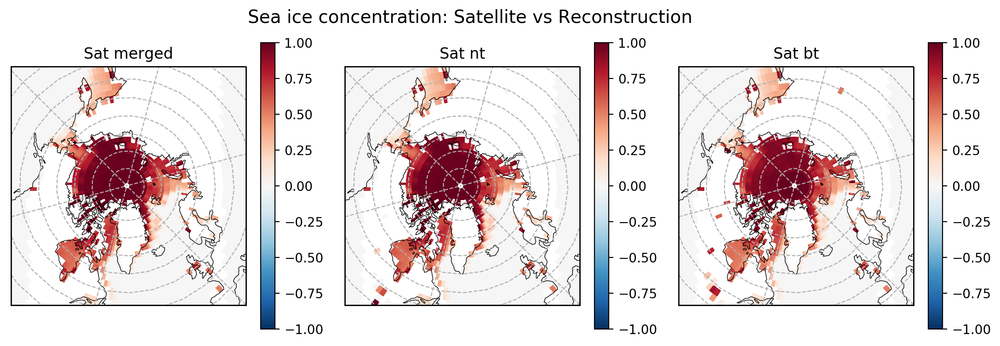

In [20]:
fig,ax = plt.subplots(1,3, figsize=(12, 4), subplot_kw = proj)

cs = sub_arctic_plot(fig,ax[0],sat_sic_merged[0,:,:],sat_ds.lat.values,
                     sat_ds.lon.values,'Sat merged',1.0)
cs1 = sub_arctic_plot(fig,ax[1],sat_sic_nt[0,:,:],sat_ds.lat.values,
                      sat_ds.lon.values,'Sat nt',1)
cs2 = sub_arctic_plot(fig,ax[2],sat_sic_bt[0,:,:],sat_ds.lat.values,
                      sat_ds.lon.values,'Sat bt',1)

# ax[1].scatter(sat_ds.lon.values[82],sat_ds.lat.values[80],
#               transform=ccrs.PlateCarree(),marker='o',edgecolors='m',s=15)

fig.suptitle('Sea ice concentration: Satellite vs Reconstruction', fontsize=14,x=0.43)
plt.tight_layout(rect=(0,0.05,0.92,0.94))

NameError: name 'sat_sic_an' is not defined

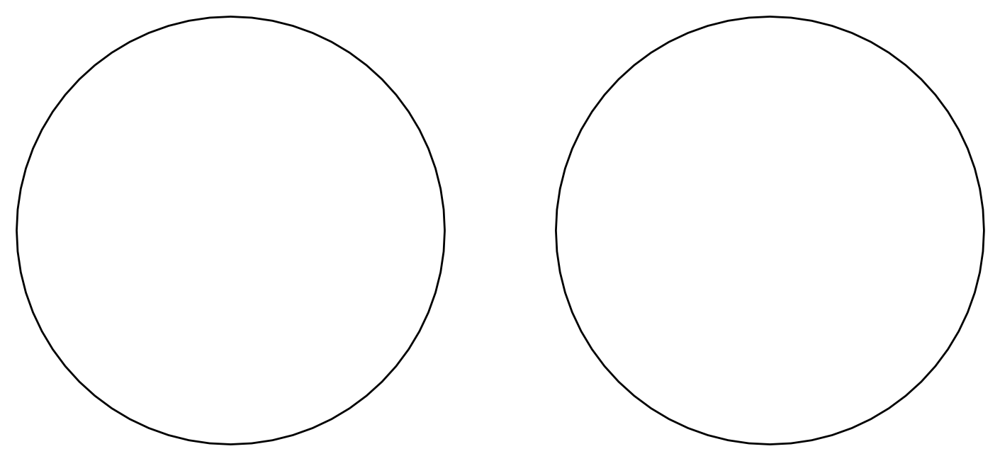

In [74]:
fig,ax = plt.subplots(1,2, figsize=(9, 4), subplot_kw = proj)

cs = sub_arctic_plot(fig,ax[0],sat_sic_an[0,:,:]*100,sat_sic.latitude.values,
                     sat_sic.longitude.values,'Satellite',100)
cs1 = sub_arctic_plot(fig,ax[1],sic_lalo_itmn_ccsm4[0,:,:],sat_sic.latitude.values,
                      sat_sic.longitude.values,'Reconstruction',100)

ax[1].scatter(sat_sic.longitude.values[82],sat_sic.latitude.values[80],
              transform=ccrs.PlateCarree(),marker='o',edgecolors='m',s=15)

fig.suptitle('Sea ice concentration: Satellite vs Reconstruction', fontsize=14,x=0.43)
plt.tight_layout(rect=(0,0.05,0.92,0.94))

In [66]:
l = [-100,-90,-70,-50,-30,-10,10,30,50,70,90,100]

np.nanmax(diff2)

87.74833299525365

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/cartopy/util.py:102: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  new_data = ma.concatenate((data, data[slicer]), axis=axis)


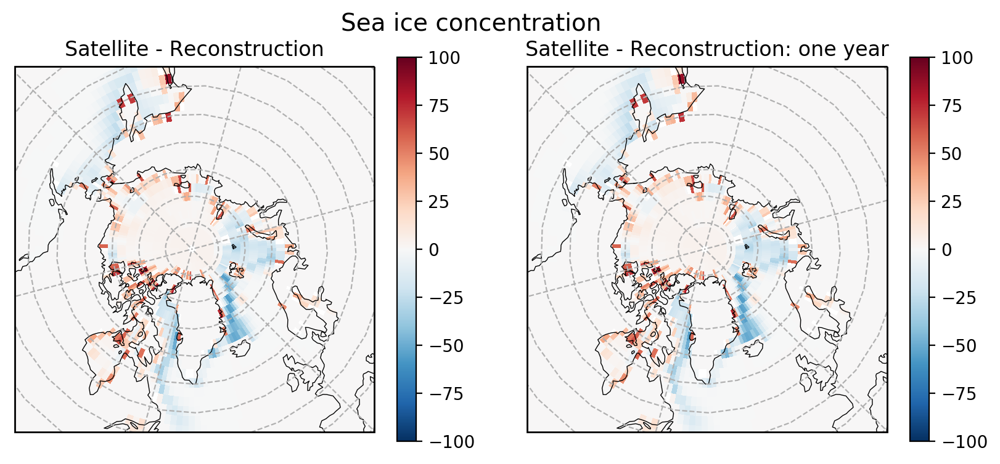

In [71]:
#diff = sat_sic_an[0,:,:]*100 - sic_lalo_itmn_ccsm4[0,:,:]
diff_m = sat_sic_merged[0,:,:]*100 - sic_lalo_itmn_ccsm4[0,:,:]
diff2 = np.where(sic_lalo_itmn_ccsm4[0,:,:]>0,diff_m,0)

fig,ax = plt.subplots(1,2, figsize=(9, 4), subplot_kw = proj)

cs = sub_arctic_plot(fig,ax[0],diff2,sat_ds.lat.values,
                     sat_ds.lon.values,'Satellite - Reconstruction',100)
cs1 = sub_arctic_plot(fig,ax[1],np.where(sic_lalo_itmn_ccsm4[0,:,:]>0,
                                         sat_sic_merged[0,:,:]*100 - sic_lalo_itmn_ccsm4[0,:,:],0),
                      sat_ds.lat.values,sat_ds.lon.values,'Satellite - Reconstruction: one year',100)

fig.suptitle('Sea ice concentration', fontsize=14,x=0.43)
plt.tight_layout(rect=(0,0.05,0.92,0.94))

In [249]:
quant = (sat_sic_an*100 - sic_lalo_itmn_ccsm4)
np.nanmax(quant)

100.0

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/cartopy/util.py:102: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  new_data = ma.concatenate((data, data[slicer]), axis=axis)
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


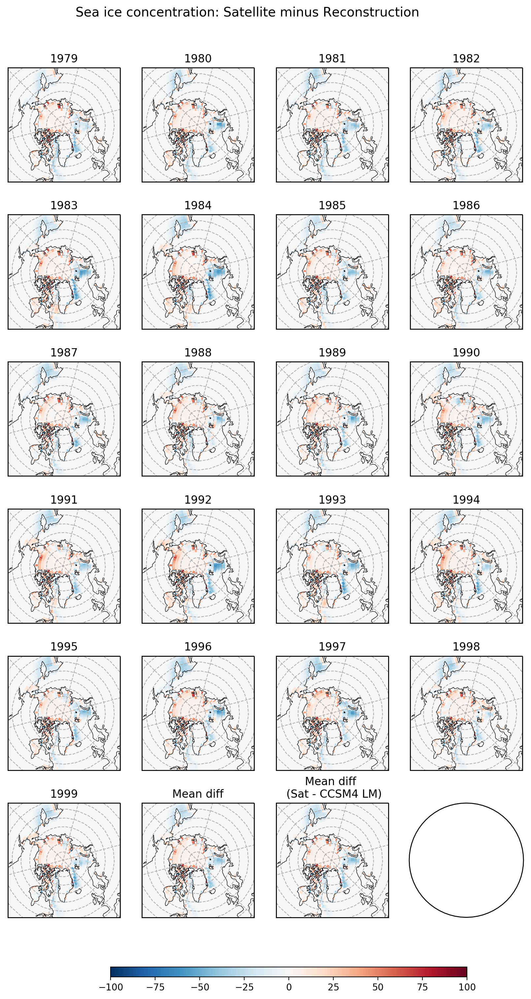

In [301]:
quant = sat_sic_an*100 - sic_lalo_itmn_ccsm4
quant_plot = np.where(sic_lalo_itmn_ccsm4[0,:,:]>0,quant,0)

fig,ax = plt.subplots(6,4, figsize=(9, 15), subplot_kw = proj)
ax=ax.flatten()

years = np.arange(1979,2000,1)

for i in range(21):
    cs = sub_arctic_plot(fig,ax[i],quant_plot[i,:,:],sat_sic.latitude.values,
                         sat_sic.longitude.values,str(years[i]),100, colorbar=False)

recon_sat_diff = np.where(sic_lalo_itmn_ccsm4[0,:,:]>0,
                          np.nanmean(sat_sic_an*100,axis=0) - np.nanmean(sic_lalo_itmn_ccsm4,axis=0),0)
lm_sat_diff = np.where(sic_lalo_itmn_ccsm4[0,:,:]>0,
                       np.nanmean(sat_sic_an*100,axis=0) - ccsm4_sic_mnstate,0)
cs = sub_arctic_plot(fig,ax[21],recon_sat_diff,sat_sic.latitude.values,
                     sat_sic.longitude.values,'Mean diff',100, colorbar=False)  
cs = sub_arctic_plot(fig,ax[22],lm_sat_diff,sat_sic.latitude.values,
                         sat_sic.longitude.values,'Mean diff \n (Sat - CCSM4 LM)',100, colorbar=False)   

position=fig.add_axes([0.2,-0.0,0.6,0.01])
cb = plt.colorbar(cs, cax=position, orientation='horizontal') #, fraction=0.05, pad=0.5)
#cb.ax.tick_params(labelsize=14)
#cb.set_label("Power (10$^6$ km$^2$)", fontsize=14)

fig.suptitle('Sea ice concentration: Satellite minus Reconstruction', fontsize=14,x=0.43)
plt.tight_layout(rect=(0,0.05,0.92,0.94))

In [72]:
r_sic = np.zeros(sic_lalo_itmn_ccsm4_2d.shape[1])
r2_sic = np.zeros(sic_lalo_itmn_ccsm4_2d.shape[1])
ce_sic = np.zeros(sic_lalo_itmn_ccsm4_2d.shape[1])

for lalo in range(sat_sic_merged_2d.shape[1]):
    r_sic[lalo],r2_sic[lalo],_ = kbstats.corr_timeseries(sat_sic_merged_2d[:,lalo]*100,sic_lalo_itmn_ccsm4_2d[:,lalo])
    ce_sic[lalo]= kbstats.coefficient_efficiency(sat_sic_merged_2d[:,lalo]*100,sic_lalo_itmn_ccsm4_2d[:,lalo])
    
r_sic_2d = np.reshape(r_sic,(91,180))
ce_sic_2d = np.reshape(ce_sic,(91,180))

/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:64: RuntimeWarning: invalid value encountered in double_scalars
  X_Y_corr = covariance(X,Y)/(X_stdev*Y_stdev)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:65: RuntimeWarning: invalid value encountered in double_scalars
  X_Y_reg = covariance(X,Y)/(X_stdev**2)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:177: RuntimeWarning: invalid value encountered in true_divide
  CE    = 1. - np.divide(numer,denom)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:177: RuntimeWarning: divide by zero encountered in true_divide
  CE    = 1. - np.divide(numer,denom)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:80: RuntimeWarning: Mean of empty slice
  X_mean = np.nanmean(X,axis=0)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:176: RuntimeWarning: Mean of empty slice
  denom = np.nansum(np.power(ref-np.nanmean(ref,axis=0),2),axis=0)


#### Check correlation and CE calculations: 

In [73]:
corr = np.zeros(sic_lalo_itmn_ccsm4_2d.shape[1])
ce = np.zeros(sic_lalo_itmn_ccsm4_2d.shape[1])

for lalo in range(sat_sic_an_2d.shape[1]):
    ce[lalo] = lmr.coefficient_efficiency(sat_sic_an_2d[:,lalo]*100,sic_lalo_itmn_ccsm4_2d[:,lalo])
    corr[lalo] = np.corrcoef(sat_sic_an_2d[:,lalo]*100,sic_lalo_itmn_ccsm4_2d[:,lalo])[0,1]

NameError: name 'sat_sic_an_2d' is not defined

NameError: name 'sat_sic' is not defined

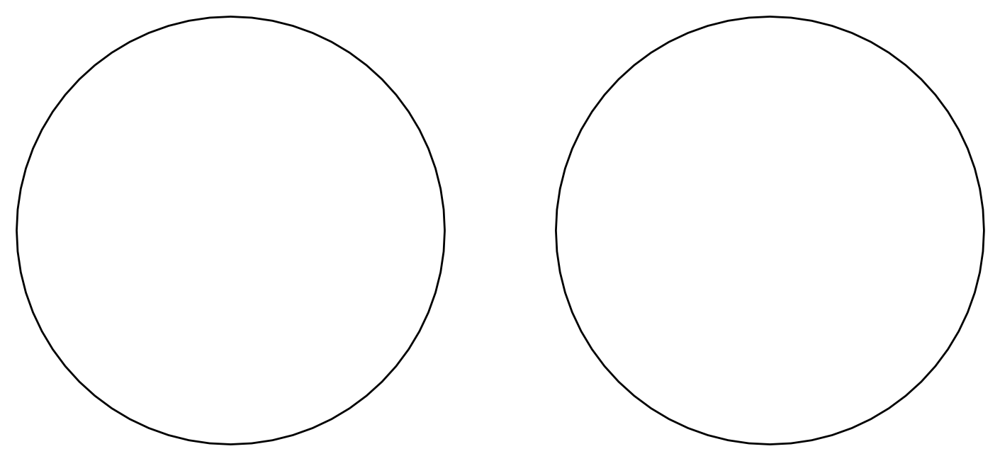

In [74]:
lat_int = 73
lon_int = 75

corr_2d = np.reshape(corr,(91,180))
ce_2d = np.reshape(ce,(91,180))

fig,ax = plt.subplots(1,2, figsize=(9, 4), subplot_kw = proj)

cs = sub_arctic_plot(fig,ax[0],ce_sic_2d - ce_2d,sat_sic.latitude.values,sat_sic.longitude.values,'kb method',1)
cs1 = sub_arctic_plot(fig,ax[1],corr_2d,sat_sic.latitude.values,sat_sic.longitude.values,'NP method',1)

fig.suptitle('Sea ice concentration: Satellite vs Reconstruction', fontsize=14,x=0.43)
plt.tight_layout(rect=(0,0.05,0.92,0.94))

ax[1].scatter(sat_sic.longitude.values[lon_int],sat_sic.latitude.values[lat_int],color='m',
              transform=ccrs.PlateCarree(),marker='o',edgecolors='k',s=15)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = '.png'
#plt.savefig(savedir+savename)

In [385]:
lat_int = 73
lon_int = 10

In [386]:
ce_sic_2d_adj = np.where(ce_sic_2d<-1.0,-1,ce_sic_2d)

In [387]:
sat_ds.lat.values[lat_int]

55.3846153846154

In [473]:
lat_int =76
lon_int = 97

# lat_int =83
# lon_int = 145

In [66]:
l2 = [-1.01,-0.9,-0.7,-0.5,-0.3,-0.1,0.1,0.3,0.5,0.7,0.9,1.0]
r_sic_2d = np.reshape(r_sic,(91,180))
ce_sic_2d = np.reshape(ce_sic,(91,180))

fig,ax = plt.subplots(1,2, figsize=(9, 4), subplot_kw = proj)
ax = ax.flatten()

cs = sub_arctic_plot(fig,ax[0],r_sic_2d,sat_ds.lat.values,sat_ds.lon.values,'hi',1)
cs1 = sub_arctic_plot(fig,ax[1],ce_sic_2d,sat_ds.lat.values,sat_ds.lon.values,'hi',1)

# cs = sub_arctic_plot_contourf(fig,ax[2],r_sic_2d,sat_ds.lat.values,sat_ds.lon.values,'hi',l2)
# cs1 = sub_arctic_plot_contourf(fig,ax[3],ce_sic_2d_adj,sat_ds.lat.values,sat_ds.lon.values,'hi',l2)

fig.suptitle('Sea ice concentration: Satellite vs Reconstruction', fontsize=14,x=0.43)
plt.tight_layout(rect=(0,0.05,0.92,0.94))

ax[1].scatter(sat_ds.lon.values[lon_int],sat_ds.lat.values[lat_int],color='m',
              transform=ccrs.PlateCarree(),marker='o',edgecolors='k',s=15)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = '.png'
#plt.savefig(savedir+savename)

NameError: name 'r_sic' is not defined

In [ ]:
sat_anom = np.reshape(sat_sic_an_anom_2d, (sat_sic_an_anom_2d.shape[0],91,180))
recon_anom = np.reshape(sic_lalo_itmn_ccsm4_anom_2d, (sic_lalo_itmn_ccsm4_anom_2d.shape[0],91,180))

plt.plot(recon_anom[:,lat_int,lon_int],label='recon')
plt.plot(sat_anom[:,lat_int,lon_int]*100, label='satellite',color='crimson')
plt.legend()
plt.title('')

Text(0.5,1,'Bering Sea')

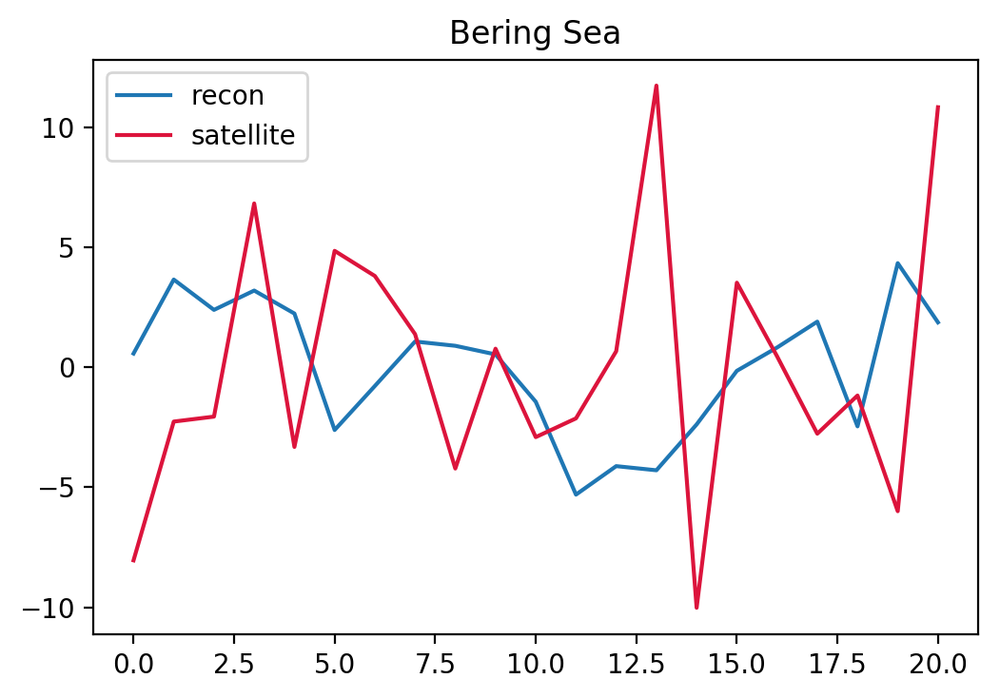

In [478]:
lat_int =76
lon_int = 97

plt.plot(recon_anom[:,lat_int,lon_int],label='recon')
plt.plot(sat_anom[:,lat_int,lon_int]*100, label='satellite',color='crimson')
plt.legend()
plt.title('Bering Sea')

Text(0.5,1,'Baffin Bay')

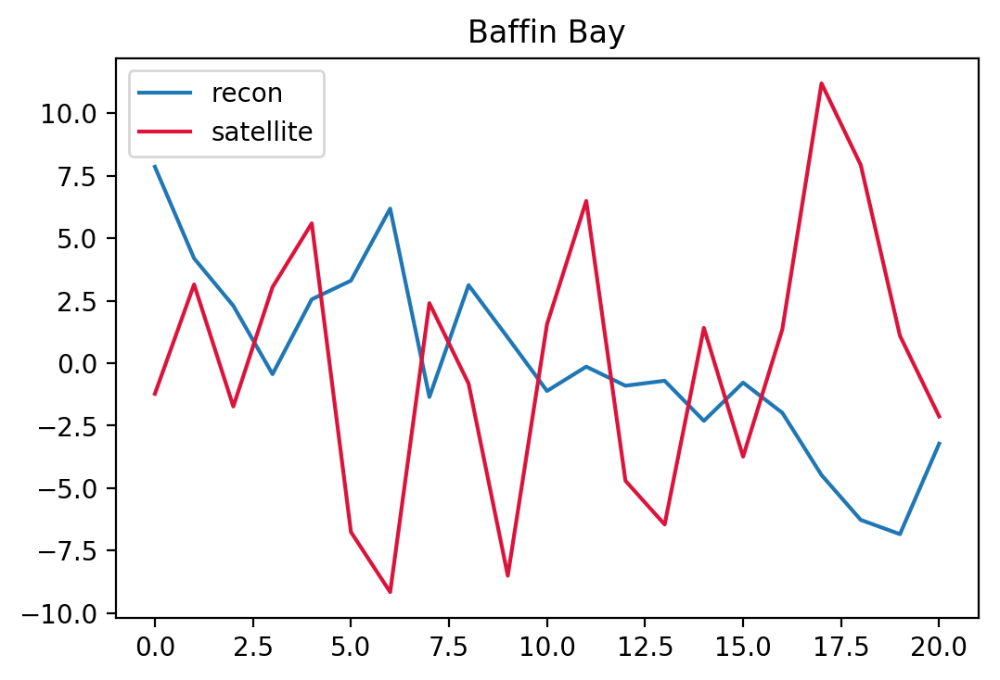

In [472]:
lat_int =83
lon_int = 145

plt.plot(recon_anom[:,lat_int,lon_int],label='recon')
plt.plot(sat_anom[:,lat_int,lon_int]*100, label='satellite',color='crimson')
plt.legend()
plt.title('Baffin Bay')


In [70]:
sic_lalo_itmn_ccsm4.shape, sat_sic_merged.shape

((21, 91, 180), (21, 91, 180))

In [25]:
sic_lalo_itmn_ccsm4_anom_2d = sic_lalo_itmn_ccsm4_2d - np.nanmean(sic_lalo_itmn_ccsm4_2d,axis=0)
sat_sic_an_anom_2d = sat_sic_merged_2d - np.nanmean(sat_sic_merged_2d ,axis=0)

r_sic_anom2, r2_sic_anom2, ce_sic_anom2 = calc_r_ce_spatial(sat_sic_an_anom_2d,
                                                            sic_lalo_itmn_ccsm4_anom_2d)

r_sic_anom2_2d = np.reshape(r_sic_anom2,(91,180))
ce_sic_anom2_2d = np.reshape(ce_sic_anom2,(91,180))

recon_mn = np.nanmean(sic_lalo_itmn_ccsm4,axis=0)/100
recon_sat_mn = np.nanmean(sic_lalo_itmn_ccsm4,axis=0)/100
sat_mn = np.nanmean(sat_sic_merged,axis=0)

recon_mn_cut = np.where(recon_mn>=0.15,recon_mn,0.0)
sat_mn_cut = np.where(sat_mn>=0.15,sat_mn,0.0)

mn_diff_sat_period = np.where(sic_lalo_itmn_ccsm4[0,:,:]>0,(sat_mn_cut - recon_mn_cut)*100,0.0)
lm_sat_diff = sat_mn_cut*100 - np.where(ccsm4_sic_mnstate>=15.0,ccsm4_sic_mnstate,0.0)

lm_sat_diff_plot = np.where(sic_lalo_itmn_ccsm4[0,:,:]>0,lm_sat_diff,0.0)

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:64: RuntimeWarning: invalid value encountered in double_scalars
  X_Y_corr = covariance(X,Y)/(X_stdev*Y_stdev)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:65: RuntimeWarning: invalid value encountered in double_scalars
  X_Y_reg = covariance(X,Y)/(X_stdev**2)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:177: RuntimeWarning: invalid value encountered in true_divide
  CE    = 1. - np.divide(numer,denom)


multiplying satellite data by 100%


/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:177: RuntimeWarning: divide by zero encountered in true_divide
  CE    = 1. - np.divide(numer,denom)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:80: RuntimeWarning: Mean of empty slice
  X_mean = np.nanmean(X,axis=0)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:176: RuntimeWarning: Mean of empty slice
  denom = np.nansum(np.power(ref-np.nanmean(ref,axis=0),2),axis=0)
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: Mean of empty slice
  if sys.path[0] == '':
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in greater_equal
  from ipykernel import kernelapp as app


/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in greater_equal
  """
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in multiply
  
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in less
  
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in less
  import sys
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/cartopy/util.py:102: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either

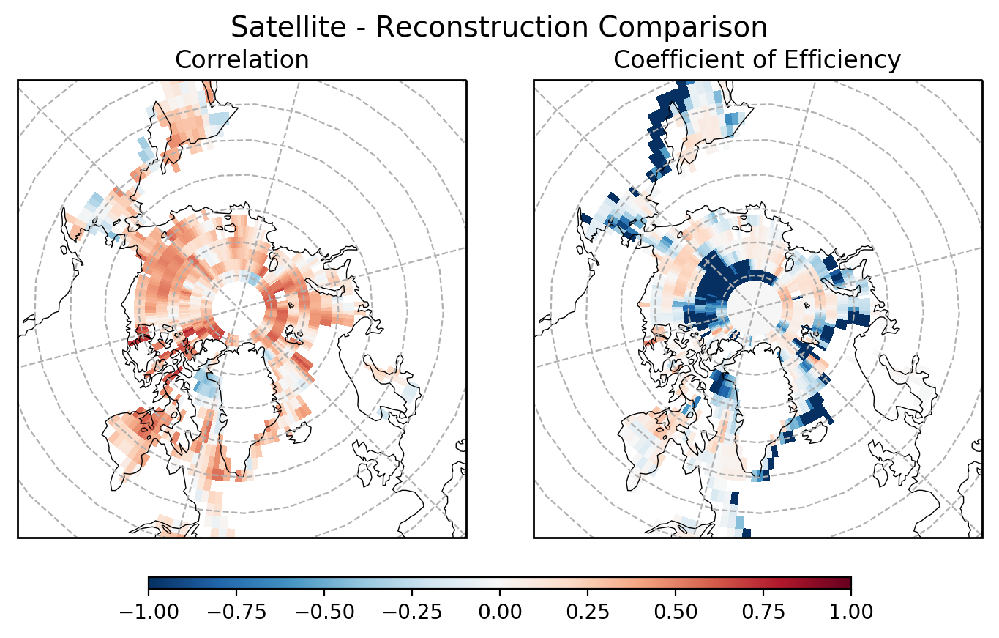

In [26]:
l2 = [-1.01,-0.9,-0.8,-0.7,-0.6,-0.5,-0.4,-0.3,-0.2,-0.1,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.01]
lab = [-1,-0.8,-0.6,-0.4,-0.2,0,0.2,0.4,0.6,0.8,1]

hold = np.where(recon_mn>0.15,1,0)
hold2 = np.where(sat_mn>=0.15,1,0)
ce_adj = np.where(hold*ce_sic_anom2_2d<-1.0,-1.0,ce_sic_anom2_2d)
r_adj = np.where(hold*r_sic_anom2_2d <-1.0,-1.0,r_sic_anom2_2d )

ce_adj[88:,:] = 0.0

fig,ax = plt.subplots(1,2, figsize=(8, 4), subplot_kw = proj)
ax = ax.flatten()

cs = sub_arctic_plot(fig,ax[0],r_sic_anom2_2d,sat_ds.lat.values,sat_ds.lon.values,
                     'Correlation',1, colorbar=False)
cs1 = sub_arctic_plot(fig,ax[1],ce_adj,sat_ds.lat.values,sat_ds.lon.values,
                      'Coefficient of Efficiency',1, colorbar=False)

position=fig.add_axes([0.15,0.0,0.6,0.02])
cb = plt.colorbar(cs, cax=position, orientation='horizontal')

fig.suptitle('Satellite - Reconstruction Comparison', fontsize=14, x=0.45)
plt.tight_layout(rect=(0,0.05,0.90,0.94))

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'sat_recon_ce_corr_spatial_validation.png'
#plt.savefig(savedir+savename, bbox_inches='tight')

### MPI

In [27]:
sic_lalo_itmn_mpi_anom_2d = sic_lalo_itmn_mpi_2d - np.nanmean(sic_lalo_itmn_mpi_2d,axis=0)
sat_sic_an_anom_2d = sat_sic_merged_2d - np.nanmean(sat_sic_merged_2d ,axis=0)

r_sic_anom2, r2_sic_anom2, ce_sic_anom2 = calc_r_ce_spatial(sat_sic_an_anom_2d,
                                                            sic_lalo_itmn_mpi_anom_2d)

r_sic_anom2_mpi_2d = np.reshape(r_sic_anom2,(91,180))
ce_sic_anom2_mpi_2d = np.reshape(ce_sic_anom2,(91,180))

recon_mpi_mn = np.nanmean(sic_lalo_itmn_mpi,axis=0)/100
sat_mn = np.nanmean(sat_sic_merged,axis=0)

recon_mn_cut = np.where(recon_mpi_mn>=0.15,recon_mn,0.0)
sat_mn_cut = np.where(sat_mn>=0.15,sat_mn,0.0)

# mn_diff_sat_period = np.where(sic_lalo_itmn_mpi[0,:,:]>0,(sat_mn_cut - recon_mn_cut)*100,0.0)
# lm_sat_diff = sat_mn_cut*100 - np.where(mpi_sic_mnstate>=15.0,mpi_sic_mnstate,0.0)

# lm_sat_diff_plot = np.where(sic_lalo_itmn_mpi[0,:,:]>0,lm_sat_diff,0.0)

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:64: RuntimeWarning: invalid value encountered in double_scalars
  X_Y_corr = covariance(X,Y)/(X_stdev*Y_stdev)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:65: RuntimeWarning: invalid value encountered in double_scalars
  X_Y_reg = covariance(X,Y)/(X_stdev**2)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:177: RuntimeWarning: invalid value encountered in true_divide
  CE    = 1. - np.divide(numer,denom)


multiplying satellite data by 100%


/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:177: RuntimeWarning: divide by zero encountered in true_divide
  CE    = 1. - np.divide(numer,denom)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:80: RuntimeWarning: Mean of empty slice
  X_mean = np.nanmean(X,axis=0)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:176: RuntimeWarning: Mean of empty slice
  denom = np.nansum(np.power(ref-np.nanmean(ref,axis=0),2),axis=0)
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: Mean of empty slice
  # This is added back by InteractiveShellApp.init_path()
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in greater_equal
  


/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in greater_equal
  """
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in multiply
  
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in less
  
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in less
  import sys
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/cartopy/util.py:102: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either

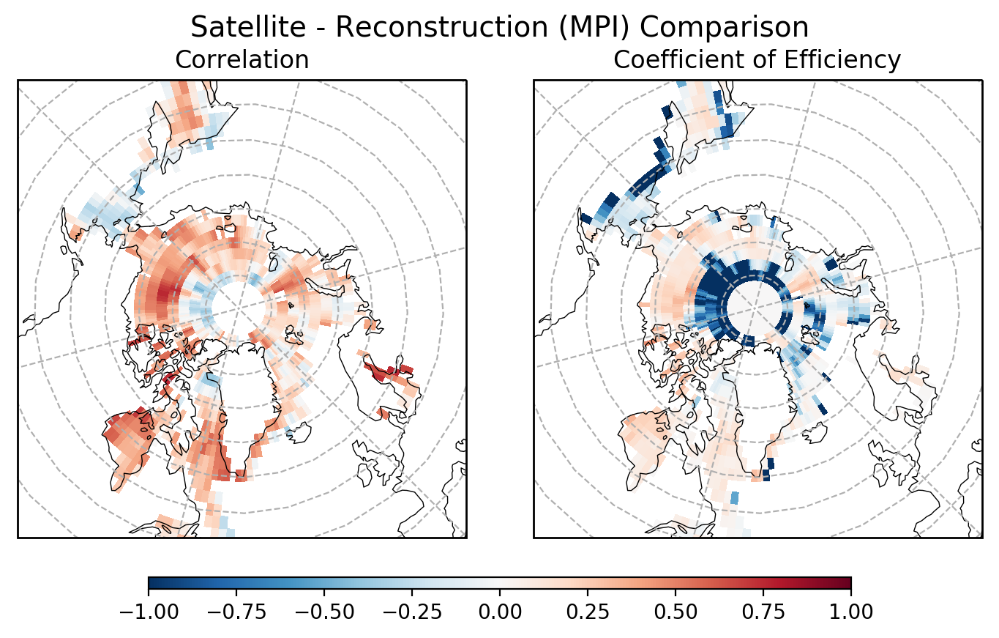

In [28]:
l2 = [-1.01,-0.9,-0.8,-0.7,-0.6,-0.5,-0.4,-0.3,-0.2,-0.1,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.01]
lab = [-1,-0.8,-0.6,-0.4,-0.2,0,0.2,0.4,0.6,0.8,1]

hold = np.where(recon_mpi_mn>0.15,1,0)
hold2 = np.where(sat_mn>=0.15,1,0)
ce_adj = np.where(hold*ce_sic_anom2_mpi_2d<-1.0,-1.0,ce_sic_anom2_mpi_2d)
r_adj = np.where(hold*r_sic_anom2_mpi_2d <-1.0,-1.0,r_sic_anom2_mpi_2d )

ce_adj[88:,:] = 0.0

fig,ax = plt.subplots(1,2, figsize=(8, 4), subplot_kw = proj)
ax = ax.flatten()

cs = sub_arctic_plot(fig,ax[0],r_sic_anom2_mpi_2d,sat_ds.lat.values,sat_ds.lon.values,
                     'Correlation',1, colorbar=False)
cs1 = sub_arctic_plot(fig,ax[1],ce_adj,sat_ds.lat.values,sat_ds.lon.values,
                      'Coefficient of Efficiency',1, colorbar=False)

position=fig.add_axes([0.15,0.0,0.6,0.02])
cb = plt.colorbar(cs, cax=position, orientation='horizontal')

fig.suptitle('Satellite - Reconstruction (MPI) Comparison', fontsize=14, x=0.45)
plt.tight_layout(rect=(0,0.05,0.90,0.94))

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'sat_recon_ce_corr_spatial_validation_mpi.png'
#plt.savefig(savedir+savename, bbox_inches='tight')

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater_equal
  
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in multiply
  This is separate from the ipykernel package so we can avoid doing imports until
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in less
  This is separate from the ipykernel package so we can avoid doing imports until
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in less
  after removing the cwd from sys.path.
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/cartopy/util.py:102: FutureWarning: Using a non-tuple sequence for multidim

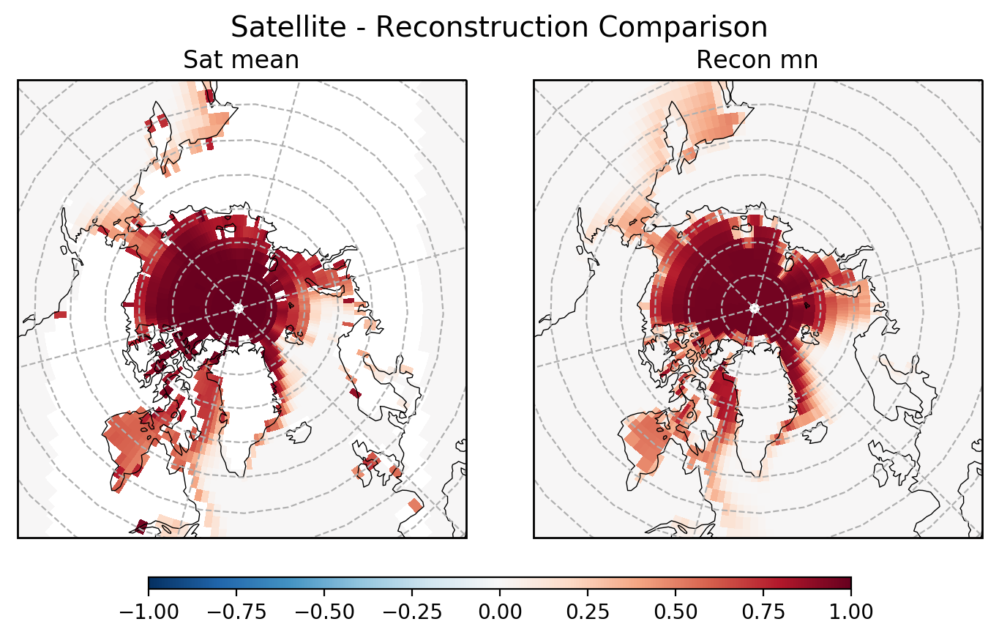

In [29]:
hold = np.where(recon_mn>0.15,1,0)
hold2 = np.where(sat_mn>=0.15,1,0)
ce_adj = np.where(hold*ce_sic_anom2_2d<-1.0,-1.0,ce_sic_anom2_2d)
r_adj = np.where(hold*r_sic_anom2_2d <-1.0,-1.0,r_sic_anom2_2d )

ce_adj[88:,:] = 0.0

fig,ax = plt.subplots(1,2, figsize=(8, 4), subplot_kw = proj)
ax = ax.flatten()

cs = sub_arctic_plot(fig,ax[0],sat_mn,sat_ds.lat.values,sat_ds.lon.values,
                     'Sat mean',1, colorbar=False)
cs1 = sub_arctic_plot(fig,ax[1],recon_mn,sat_ds.lat.values,sat_ds.lon.values,
                      'Recon mn',1, colorbar=False)

position=fig.add_axes([0.15,0.0,0.6,0.02])
cb = plt.colorbar(cs, cax=position, orientation='horizontal')

fig.suptitle('Satellite - Reconstruction Comparison', fontsize=14, x=0.45)
plt.tight_layout(rect=(0,0.05,0.90,0.94))

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'sat_recon_ce_corr_spatial_validation.png'
#plt.savefig(savedir+savename, bbox_inches='tight')

In [32]:
mn_diff_sat_period = np.where(recon_mn>0.15,(sat_mn - recon_mn)*100,0.0)
lm_sat_diff = sat_mn*100 - ccsm4_sic_mnstate

lm_sat_diff_plot = np.where(ccsm4_sic_mnstate>15,lm_sat_diff,0.0)

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/cartopy/util.py:102: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  new_data = ma.concatenate((data, data[slicer]), axis=axis)
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


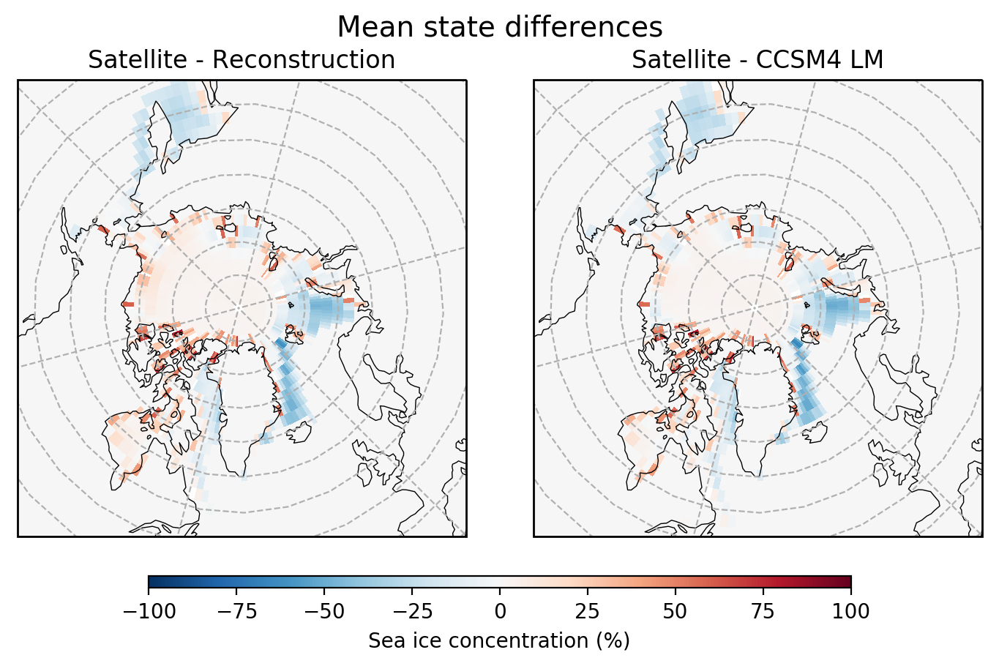

In [33]:
l2 = [-100.01,-90,-80,-70,-60,-50,-40,-30,-20,-10,10,20,30,40,50,60,70,80,90,100.01]
lab = [-100,-80,-60,-40,-20,0,20,40,60,80,100]

fig,ax = plt.subplots(1,2, figsize=(8, 4), subplot_kw = proj)
ax = ax.flatten()

cs = sub_arctic_plot(fig,ax[0],mn_diff_sat_period,sat_ds.lat.values,sat_ds.lon.values,
                     'Satellite - Reconstruction',100, colorbar=False)
cs1 = sub_arctic_plot(fig,ax[1],lm_sat_diff_plot,sat_ds.lat.values,sat_ds.lon.values,
                      'Satellite - CCSM4 LM',100, colorbar=False)

position=fig.add_axes([0.15,-0.0,0.6,0.02])
cb = plt.colorbar(cs, cax=position, label='Sea ice concentration (%)',orientation='horizontal')

fig.suptitle('Mean state differences', fontsize=14, x=0.45)
plt.tight_layout(rect=(0,0.05,0.90,0.94))

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'sat_recon_lm_mnstat_differences.png'
#plt.savefig(savedir+savename,  bbox_inches='tight')

In [40]:
np.nanmin(lm_sat_diff_plot)

-98.04397960851514

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/cartopy/util.py:102: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  new_data = ma.concatenate((data, data[slicer]), axis=axis)
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


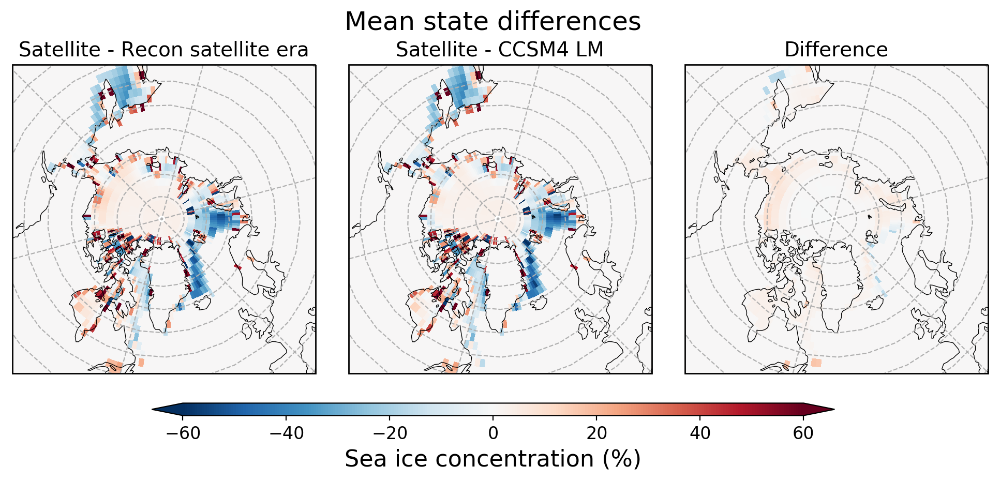

In [32]:
l2 = [-60.01,-50,-40,-30,-20,-10,10,20,30,40,50,60.01]
lab = [-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60]

fig,ax = plt.subplots(1,3, figsize=(11, 4), subplot_kw = proj)
ax = ax.flatten()

cs = sub_arctic_plot(fig,ax[0],mn_diff_sat_period,sat_ds.lat.values,sat_ds.lon.values,
                     'Satellite - Reconstruction',60, colorbar=False)
cs1 = sub_arctic_plot(fig,ax[1],lm_sat_diff_plot,sat_ds.lat.values,sat_ds.lon.values,
                      'Satellite - Reconstruction',60, colorbar=False)
cs2 = sub_arctic_plot(fig,ax[2],mn_diff_sat_period - lm_sat_diff_plot,sat_ds.lat.values,sat_ds.lon.values,
                      'Satellite - Reconstruction',60, colorbar=False)


position=fig.add_axes([0.15,-0.0,0.6,0.03])
cb = plt.colorbar(cs, cax=position,orientation='horizontal',extend='both')
cb.set_label('Sea ice concentration (%)',fontsize=16)
cb.ax.tick_params(labelsize=12)

ax[0].set_title('Satellite - Recon satellite era', fontsize=14)
ax[1].set_title('Satellite - CCSM4 LM', fontsize=14)
ax[2].set_title('Difference', fontsize=14)

fig.suptitle('Mean state differences', fontsize=18, x=0.45)
plt.tight_layout(rect=(0,0.05,0.90,0.90))

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'sat_recon_lm_mnstat_differences.png'
#plt.savefig(savedir+savename,  bbox_inches='tight')

In [288]:
np.nanmax(ccsm4_sic_mnstate)

98.96121739198473

## Compare anomalies?

In [209]:
import warnings
warnings.filterwarnings('ignore')

In [23]:
def calc_r_ce_spatial(true,recon):
    """
    Finds R, R^2 and CE values at every grid cell. 
    
    INPUTS:
    true: 2d field (time, lat*lon)
    recon: 2d field (time, lat*lon)
    
    OUTPUTS:
    r: correlation coefficient, 1d field (lat*lon)
    r2: correlation coefficient squared, 1d field (lat*lon)
    ce: coefficient of efficiency, 1d field (lat*lon)
    """
    if np.nanmax(recon)>2.0:
        if np.nanmax(true)>2.0:
            true = true
        else: 
            print('multiplying satellite data by 100%')
            true = true*100.0
    else: 
        if np.nanmax(true)>2.0:
            print('dividing satellite data by 100%')
            true = true/100.0
        else: 
            true = true
    
    r = np.zeros(true.shape[1])
    r2 = np.zeros(true.shape[1])
    ce = np.zeros(true.shape[1])

    for lalo in range(true.shape[1]):
        r[lalo],r2[lalo],_ = kbstats.corr_timeseries(true[:,lalo],recon[:,lalo])
        ce[lalo]= kbstats.coefficient_efficiency(true[:,lalo],recon[:,lalo])
    
    return r, r2, ce

In [24]:
def plot_corr_ce_mnstate(r,ce,recon_mn,sat_mn,lat,lon,levels,title,labels=None):
    if labels is None: 
        labels = levels
        
    hold = np.where(recon_mn>0.15,1,0)
    hold2 = np.where(sat_mn>=0.15,1,0)
    ce_adj = np.where(hold*ce<-1.0,-1.0,ce)

    fig,ax = plt.subplots(3,2, figsize=(9, 12), subplot_kw = proj)
    ax = ax.flatten()

    cs = sub_arctic_plot(fig,ax[0],r,lat,lon,'Correlation',1)
    cs1 = sub_arctic_plot(fig,ax[1],ce_adj,lat,lon,'Coefficient of Coefficient',1)

    cs2 = sub_arctic_plot_contourf(fig,ax[2],r,lat,lon,'Correlation',levels,labels=labels)
    cs3 = sub_arctic_plot_contourf(fig,ax[3],ce_adj,lat,lon,'Coefficient of Coefficient',levels,labels=labels)

    cs4 = sub_arctic_plot_contourf(fig,ax[4],hold,lat,lon,'Reconstruction mean state',levels,labels=labels)
    cs5 = sub_arctic_plot_contourf(fig,ax[5],hold2,lat,lon,'Satellite mean state',levels, labels=labels)

    fig.suptitle(title, fontsize=14,x=0.43)
    plt.tight_layout(rect=(0,0.05,0.92,0.94))

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:64: RuntimeWarning: invalid value encountered in double_scalars
  X_Y_corr = covariance(X,Y)/(X_stdev*Y_stdev)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:65: RuntimeWarning: invalid value encountered in double_scalars
  X_Y_reg = covariance(X,Y)/(X_stdev**2)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:177: RuntimeWarning: invalid value encountered in true_divide
  CE    = 1. - np.divide(numer,denom)


multiplying satellite data by 100%


/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:177: RuntimeWarning: divide by zero encountered in true_divide
  CE    = 1. - np.divide(numer,denom)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:80: RuntimeWarning: Mean of empty slice
  X_mean = np.nanmean(X,axis=0)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:176: RuntimeWarning: Mean of empty slice
  denom = np.nansum(np.power(ref-np.nanmean(ref,axis=0),2),axis=0)
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: Mean of empty slice
  # This is added back by InteractiveShellApp.init_path()
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in greater_equal
  
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in multiply
  impor

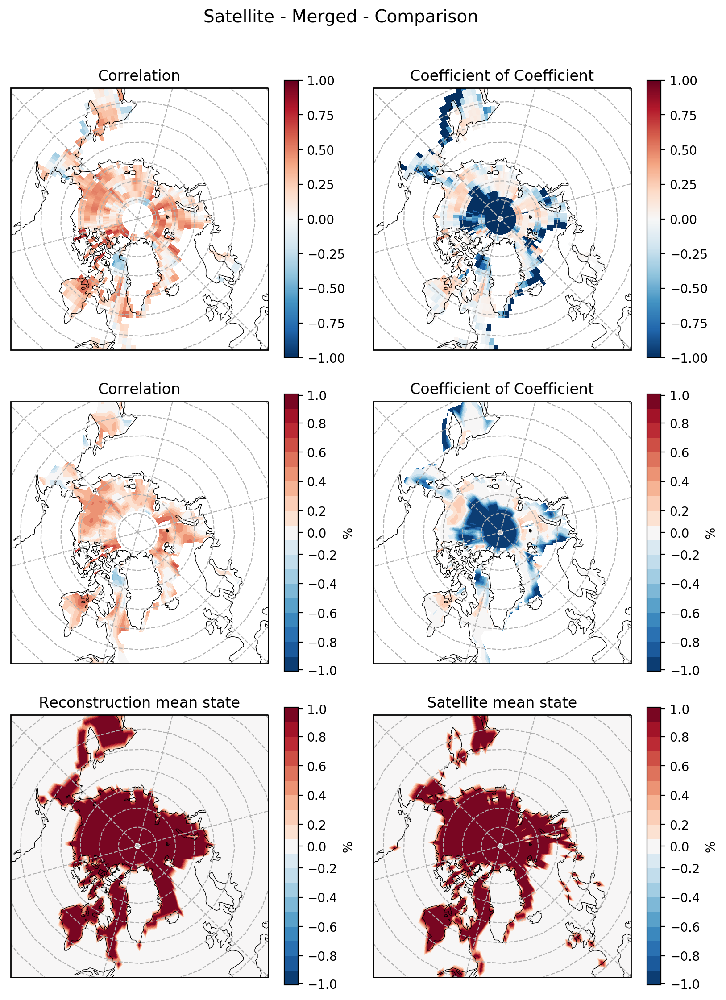

In [22]:
sic_lalo_itmn_ccsm4_anom_2d = sic_lalo_itmn_ccsm4_2d - np.nanmean(sic_lalo_itmn_ccsm4_2d,axis=0)
sat_sic_an_anom_2d = sat_sic_merged_2d - np.nanmean(sat_sic_merged_2d ,axis=0)

r_sic_anom2, r2_sic_anom2, ce_sic_anom2 = calc_r_ce_spatial(sat_sic_an_anom_2d,
                                                            sic_lalo_itmn_ccsm4_anom_2d)

r_sic_anom2_2d = np.reshape(r_sic_anom2,(91,180))
ce_sic_anom2_2d = np.reshape(ce_sic_anom2,(91,180))

recon_mn = np.nanmean(sic_lalo_itmn_ccsm4,axis=0)/100
sat_mn = np.nanmean(sat_sic_merged,axis=0)

Tit = 'Satellite - Merged - Comparison'
l2 = [-1.01,-0.9,-0.8,-0.7,-0.6,-0.5,-0.4,-0.3,-0.2,-0.1,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.01]
lab = [-1.0,-0.8,-0.6,-0.4,-0.2,0.0,0.2,0.4,0.6,0.8,1.0]
plot_corr_ce_mnstate(r_sic_anom2_2d,ce_sic_anom2_2d,recon_mn,sat_mn,
                     sat_ds.lat.values,sat_ds.lon.values,l2,Tit,labels=lab)

multiplying satellite data by 100%


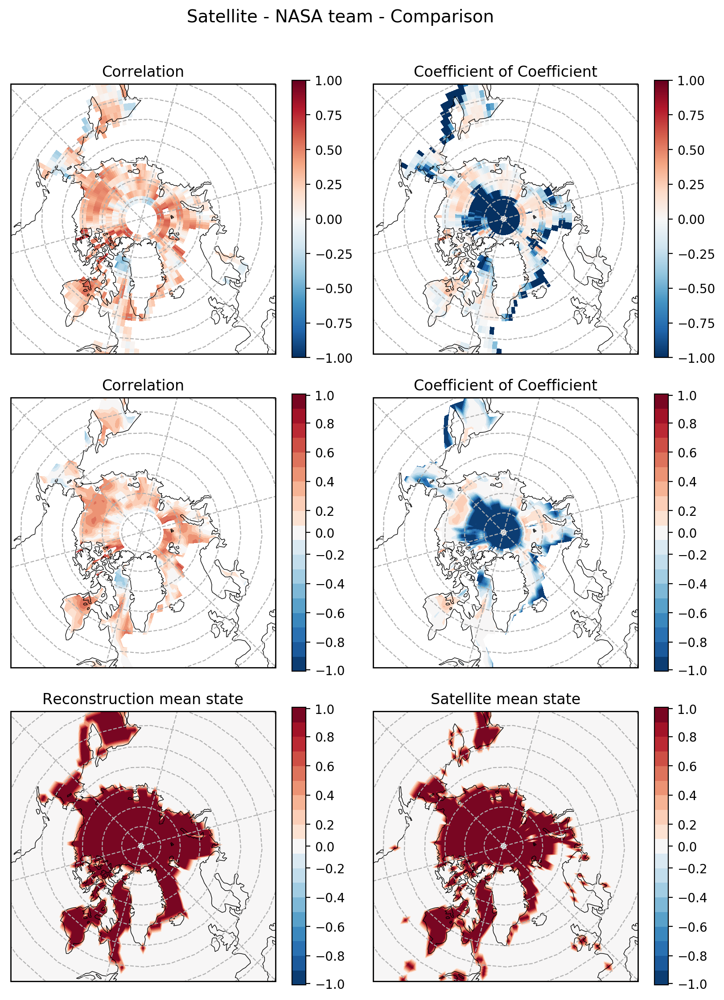

In [284]:
sic_lalo_itmn_ccsm4_anom_2d = sic_lalo_itmn_ccsm4_2d - np.nanmean(sic_lalo_itmn_ccsm4_2d,axis=0)
sat_sic_an_anom_2d = sat_sic_nt_2d - np.nanmean(sat_sic_nt_2d ,axis=0)

r_sic_anom2, r2_sic_anom2, ce_sic_anom2 = calc_r_ce_spatial(sat_sic_an_anom_2d,
                                                            sic_lalo_itmn_ccsm4_anom_2d)

r_sic_anom2_2d = np.reshape(r_sic_anom2,(91,180))
ce_sic_anom2_2d = np.reshape(ce_sic_anom2,(91,180))

recon_mn = np.nanmean(sic_lalo_itmn_ccsm4,axis=0)/100
sat_mn = np.nanmean(sat_sic_nt,axis=0)

Tit = 'Satellite - NASA team - Comparison'
plot_corr_ce_mnstate(r_sic_anom2_2d,ce_sic_anom2_2d,recon_mn,sat_mn,
                     sat_ds.lat.values,sat_ds.lon.values,l2,Tit,labels=lab)

multiplying satellite data by 100%


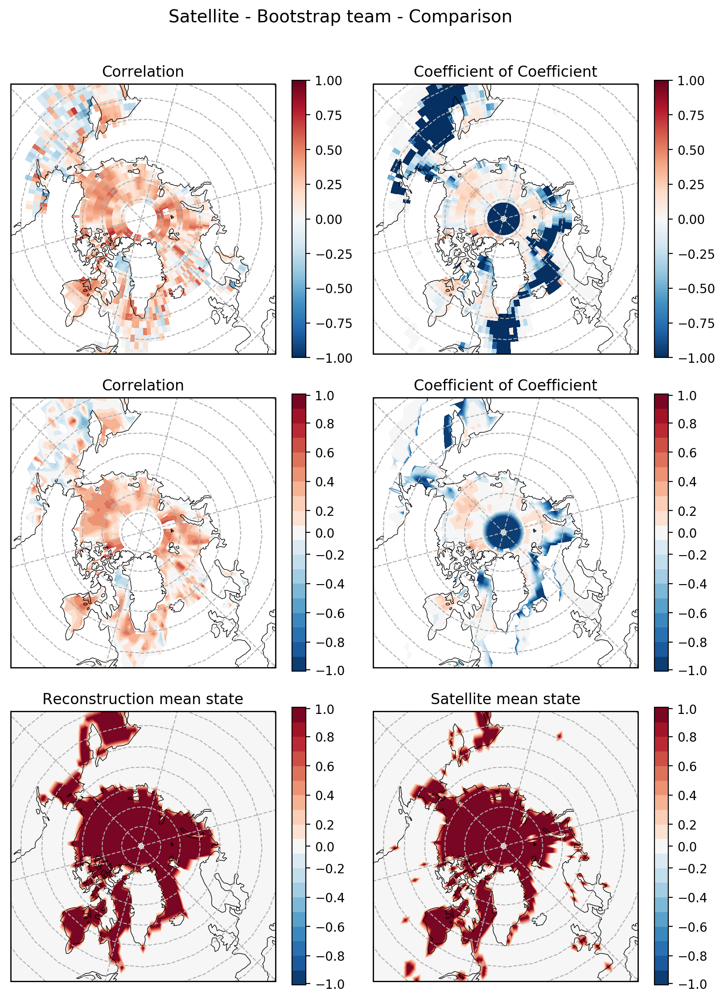

In [283]:
sic_lalo_itmn_ccsm4_anom_2d = sic_lalo_itmn_ccsm4_2d - np.nanmean(sic_lalo_itmn_ccsm4_2d,axis=0)
sat_sic_an_anom_2d = sat_sic_bt_2d - np.nanmean(sat_sic_bt_2d ,axis=0)

r_sic_anom2, r2_sic_anom2, ce_sic_anom2 = calc_r_ce_spatial(sat_sic_an_anom_2d,
                                                            sic_lalo_itmn_ccsm4_anom_2d)

r_sic_anom2_2d = np.reshape(r_sic_anom2,(91,180))
ce_sic_anom2_2d = np.reshape(ce_sic_anom2,(91,180))

recon_mn = np.nanmean(sic_lalo_itmn_ccsm4,axis=0)/100
sat_mn = np.nanmean(sat_sic_bt,axis=0)

Tit = 'Satellite - Bootstrap team - Comparison'
plot_corr_ce_mnstate(r_sic_anom2_2d,ce_sic_anom2_2d,recon_mn,sat_mn,
                     sat_ds.lat.values,sat_ds.lon.values,l2,Tit,labels=lab)

In [182]:
sic_lalo_itmn_ccsm4_anom_2d = sic_lalo_itmn_ccsm4_2d - np.nanmean(sic_lalo_itmn_ccsm4_2d,axis=0)
sat_sic_an_anom_2d = sat_sic_merged_2d - np.nanmean(sat_sic_merged_2d ,axis=0)

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  


In [183]:
r_sic_anom = np.zeros(sic_lalo_itmn_ccsm4_2d.shape[1])
r2_sic_anom = np.zeros(sic_lalo_itmn_ccsm4_2d.shape[1])
ce_sic_anom = np.zeros(sic_lalo_itmn_ccsm4_2d.shape[1])

for lalo in range(sat_sic_merged_2d .shape[1]):
    r_sic_anom[lalo],r2_sic_anom[lalo],_ = kbstats.corr_timeseries(sat_sic_an_anom_2d[:,lalo]*100,
                                                                   sic_lalo_itmn_ccsm4_anom_2d[:,lalo])
    ce_sic_anom[lalo]= kbstats.coefficient_efficiency(sat_sic_an_anom_2d[:,lalo]*100,
                                                      sic_lalo_itmn_ccsm4_anom_2d[:,lalo])

/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:64: RuntimeWarning: invalid value encountered in double_scalars
  X_Y_corr = covariance(X,Y)/(X_stdev*Y_stdev)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:65: RuntimeWarning: invalid value encountered in double_scalars
  X_Y_reg = covariance(X,Y)/(X_stdev**2)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:177: RuntimeWarning: invalid value encountered in true_divide
  CE    = 1. - np.divide(numer,denom)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:177: RuntimeWarning: divide by zero encountered in true_divide
  CE    = 1. - np.divide(numer,denom)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:80: RuntimeWarning: Mean of empty slice
  X_mean = np.nanmean(X,axis=0)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:176: RuntimeWarning: Mean of empty slice
  denom = np.nansum(np.power(ref-np.nanmean(ref,axis=0),2),axis=0)


In [156]:
lat_int = 73
lon_int = 85

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: Mean of empty slice
  """
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: All-NaN slice encountered
  
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in greater
  # This is added back by InteractiveShellApp.init_path()
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in multiply
  if sys.path[0] == '':
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in less
  if sys.path[0] == '':
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/cartop

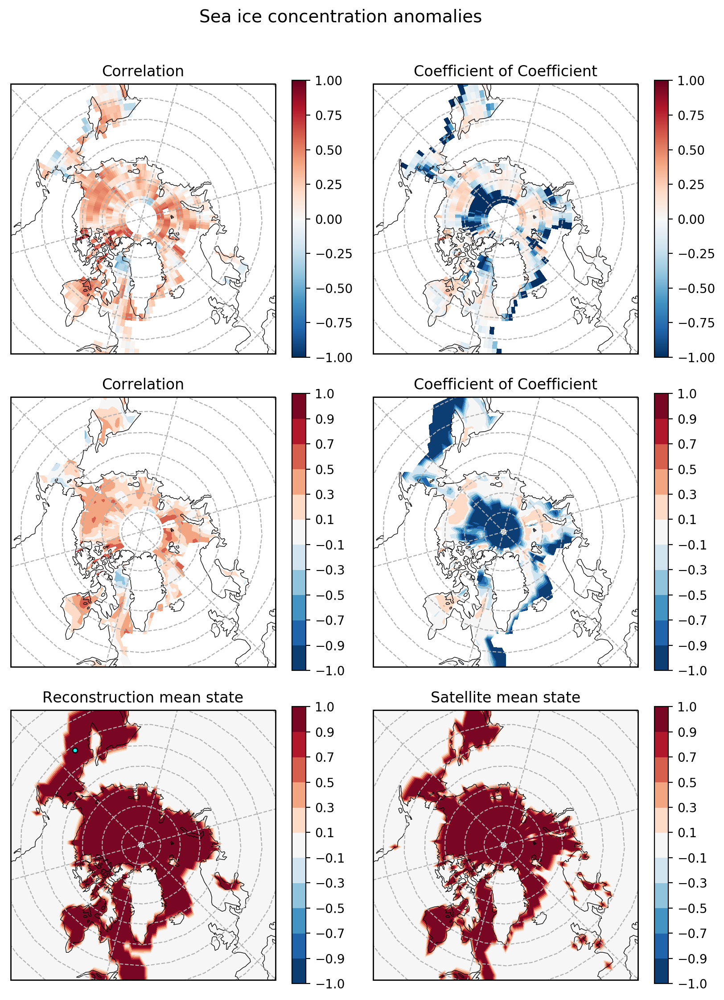

In [190]:
r_sic_anom_2d = np.reshape(r_sic_anom,(91,180))
ce_sic_anom_2d = np.reshape(ce_sic_anom,(91,180))

recon_mn = np.nanmean(sic_lalo_itmn_ccsm4,axis=0)/100
sat_mn = np.nanmean(sat_sic_merged,axis=0)

recon_mx = np.nanmax(sic_lalo_itmn_ccsm4,axis=0)/100
sat_mx = np.nanmax(sat_sic_merged,axis=0)

hold = np.where(recon_mn>0.01,1,0)
hold2 = np.where(sat_mn>0.01,1,0)
ce_sic_anom_2d_adj = np.where(hold*ce_sic_anom_2d<-1.0,-1.0,ce_sic_anom_2d)

fig,ax = plt.subplots(3,2, figsize=(9, 12), subplot_kw = proj)
ax = ax.flatten()

cs = sub_arctic_plot(fig,ax[0],r_sic_anom_2d,sat_ds.lat.values,sat_ds.lon.values,'Correlation',1)
cs1 = sub_arctic_plot(fig,ax[1],ce_sic_anom_2d,sat_ds.lat.values,sat_ds.lon.values,
                      'Coefficient of Coefficient',1)

cs2 = sub_arctic_plot_contourf(fig,ax[2],r_sic_anom_2d,sat_ds.lat.values,sat_ds.lon.values,'Correlation',l2)
cs3 = sub_arctic_plot_contourf(fig,ax[3],ce_sic_anom_2d_adj,sat_ds.lat.values,sat_ds.lon.values,
                      'Coefficient of Coefficient',l2)

cs4 = sub_arctic_plot_contourf(fig,ax[4],hold,
                               sat_ds.lat.values,sat_ds.lon.values,'Reconstruction mean state',l2)
cs5 = sub_arctic_plot_contourf(fig,ax[5],hold2,
                               sat_ds.lat.values,sat_ds.lon.values,
                               'Satellite mean state',l2)

ax[4].scatter(sat_ds.lon.values[lon_int],sat_ds.lat.values[lat_int],color='cyan',
              transform=ccrs.PlateCarree(),marker='o',edgecolors='k',s=15)

fig.suptitle('Sea ice concentration anomalies', fontsize=14,x=0.43)
plt.tight_layout(rect=(0,0.05,0.92,0.94))

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = '.png'
#plt.savefig(savedir+savename)

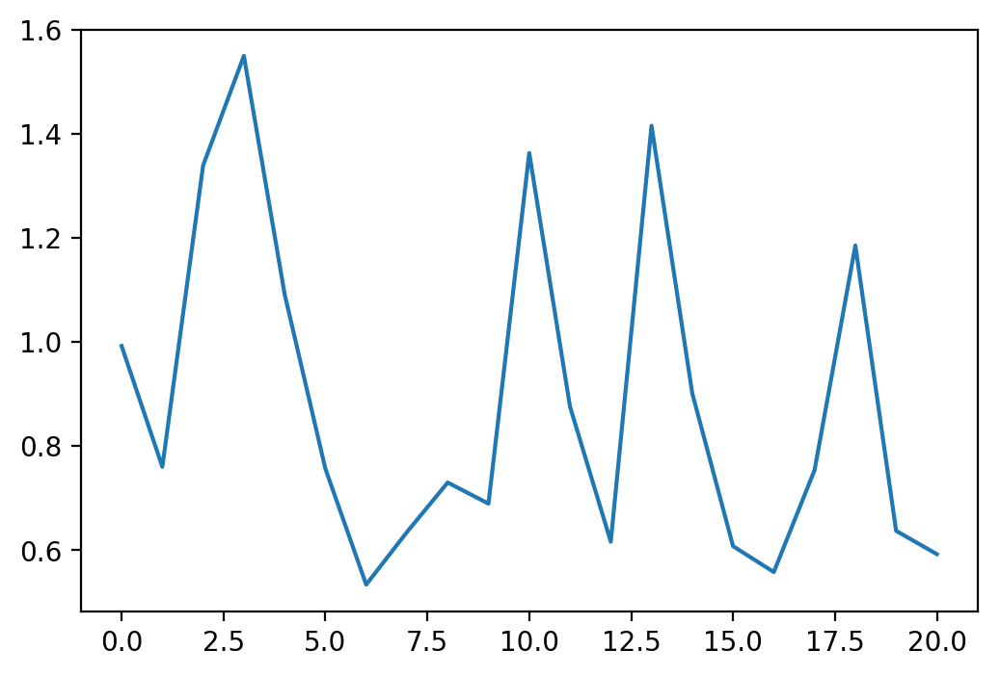

In [163]:
plt.plot(sic_lalo_itmn_ccsm4[:,82,9])

In [165]:
sic_lalo_itmn_ccsm4.max()

99.14653629997065

## Verify extent?

In [53]:
cutoff = 90.0

In [54]:
sie_lalo_allit_ccsm4 = np.where(sic_lalo_allit_ccsm4>=cutoff,100.0,sic_lalo_allit_ccsm4)
sie_lalo_itmn_ccsm4 = np.nanmean(sie_lalo_allit_ccsm4,axis=3)[1979:,:,:]
sie_lalo_itmn_ccsm4_2d = np.reshape(sie_lalo_itmn_ccsm4,
                                    (sie_lalo_itmn_ccsm4.shape[0],
                                     sie_lalo_itmn_ccsm4.shape[1]*sie_lalo_itmn_ccsm4.shape[2]))

In [81]:
#sat_sie_an = np.where(sat_sic_an*100>=cutoff,np.nan,sat_sic_an)
sat_sie_an_2d = np.reshape(sat_sie_an,(sat_sie_an.shape[0],sat_sie_an.shape[1]*sat_sie_an.shape[2]))

sat_nan = np.where(np.nanmean(sat_sie_an,axis=0)*100>=90.0,1000.0,0.0)
np.nanmax(np.nanmean(sat_sie_an,axis=0))

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: Mean of empty slice
  after removing the cwd from sys.path.
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in greater_equal
  after removing the cwd from sys.path.
/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: Mean of empty slice
  """


0.8995276704993439

In [96]:
r_sie = np.zeros(sic_lalo_itmn_ccsm4_2d.shape[1])
r2_sie = np.zeros(sic_lalo_itmn_ccsm4_2d.shape[1])
ce_sie = np.zeros(sic_lalo_itmn_ccsm4_2d.shape[1])

for lalo in range(sat_sic_an_2d.shape[1]):
    r_sie[lalo],r2_sie[lalo],_ = kbstats.corr_timeseries(sat_sie_an_2d[:,lalo]*100,sie_lalo_itmn_ccsm4_2d[:,lalo])
    ce_sie[lalo]= kbstats.coefficient_efficiency(sat_sie_an_2d[:,lalo]*100,sie_lalo_itmn_ccsm4_2d[:,lalo])

/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:64: RuntimeWarning: invalid value encountered in double_scalars
  X_Y_corr = covariance(X,Y)/(X_stdev*Y_stdev)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:65: RuntimeWarning: invalid value encountered in double_scalars
  X_Y_reg = covariance(X,Y)/(X_stdev**2)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:177: RuntimeWarning: invalid value encountered in true_divide
  CE    = 1. - np.divide(numer,denom)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:177: RuntimeWarning: divide by zero encountered in true_divide
  CE    = 1. - np.divide(numer,denom)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:80: RuntimeWarning: Mean of empty slice
  X_mean = np.nanmean(X,axis=0)
/home/disk/p/mkb22/Documents/si_utils_kb/stats_utils.py:176: RuntimeWarning: Mean of empty slice
  denom = np.nansum(np.power(ref-np.nanmean(ref,axis=0),2),axis=0)


TypeError: 'GeoAxesSubplot' object does not support indexing

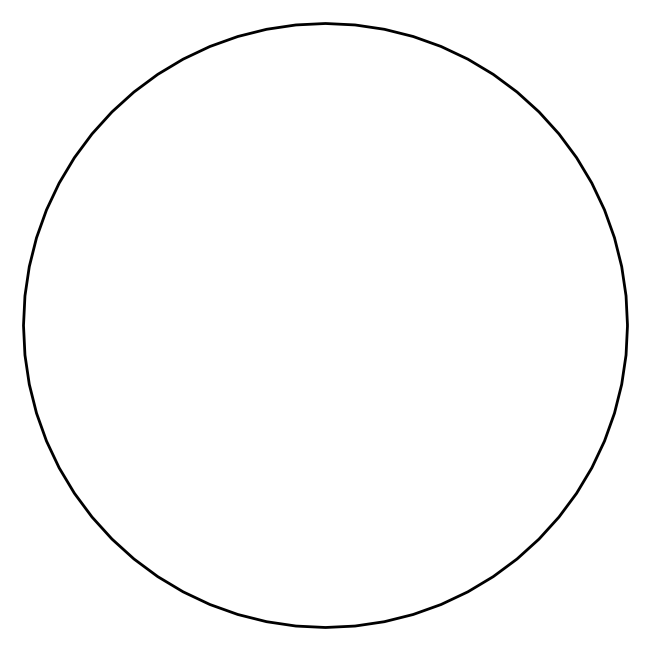

In [129]:
r_sie_2d = np.reshape(r_sie,(91,180))
ce_sie_2d = np.reshape(ce_sie,(91,180))

fig,ax = plt.subplots(1,2, figsize=(9, 4), subplot_kw = proj)

cs = sub_arctic_plot(fig,ax[0],r_sie_2d,sat_sic.latitude.values,sat_sic.longitude.values,'hi',1)
#cs = sub_arctic_plot(fig,ax[0],stip,sat_sic.latitude.values,sat_sic.longitude.values,'hi',1)

cs1 = sub_arctic_plot(fig,ax[1],ce_sie_2d,sat_sic.latitude.values,sat_sic.longitude.values,'hi',1)


fig.suptitle('Sea ice concentration: Satellite vs Reconstruction', fontsize=14,x=0.43)
plt.tight_layout(rect=(0,0.05,0.92,0.94))

ax[1].scatter(sat_sic.longitude.values[lon_int],sat_sic.latitude.values[lat_int],color='m',
              transform=ccrs.PlateCarree(),marker='o',edgecolors='k',s=15)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = '.png'
#plt.savefig(savedir+savename)

In [184]:
stip

array([[   0.,    0.,    0., ...,    0.,    0.,    0.],
       [   0.,    0.,    0., ...,    0.,    0.,    0.],
       [   0.,    0.,    0., ...,    0.,    0.,    0.],
       ...,
       [-100., -100., -100., ..., -100., -100., -100.],
       [-100., -100., -100., ..., -100., -100., -100.],
       [-100., -100., -100., ..., -100., -100., -100.]])

In [124]:
def sub_arctic_plot2(fig,ax,VAR1,LAT,LON,TITLE1,MAX1,stipple=None,colorbar=True,extent=True):
    var1, lon1 = add_cyclic_point(VAR1, coord=LON)
    new_lon2d, new_lat2d = np.meshgrid(lon1, LAT)
    if extent is True: 
        ax.set_extent([-150, 140, 50, 90], crs=ccrs.PlateCarree())
    ax.gridlines(linestyle='--')
    ax.add_feature(cfeature.LAND, facecolor=(1, 1, 1))
    cs = ax.pcolormesh(new_lon2d, new_lat2d, var1, 
                       vmin=-MAX1, vmax=MAX1, cmap=plt.cm.RdBu_r, 
                       transform=ccrs.PlateCarree())
    
    if not stipple is None: 
        cs2 = ax.contourf(new_lon2d, new_lat2d, stip, levels=[0, 1, 2], cmap=plt.cm.Greys)#,transform=ccrs.PlateCarree())
        
    ax.coastlines(resolution='110m', linewidth=0.5)
    if colorbar is True:
        plt.colorbar(cs, ax=ax)
    ax.set_title(TITLE1)

In [203]:
r_sic_aj_2d = np.where(np.isnan(r_sic_2d),0.0,r_sic_2d)
r_sic_aj_2d

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

In [209]:
r_sic_2d

array([[           nan,            nan,            nan, ...,
                   nan,            nan,            nan],
       [           nan,            nan,            nan, ...,
                   nan,            nan,            nan],
       [           nan,            nan,            nan, ...,
                   nan,            nan,            nan],
       ...,
       [           nan,            nan,            nan, ...,
                   nan,            nan,            nan],
       [           nan,            nan, 1.05190375e-14, ...,
                   nan,            nan,            nan],
       [           nan,            nan,            nan, ...,
                   nan,            nan,            nan]])

In [179]:
stip_nan = np.where(np.isclose(stip,1.0,atol=10e-2),-1000.0,0.0)

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/cartopy/util.py:102: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  new_data = ma.concatenate((data, data[slicer]), axis=axis)


Text(0.5,1,'')

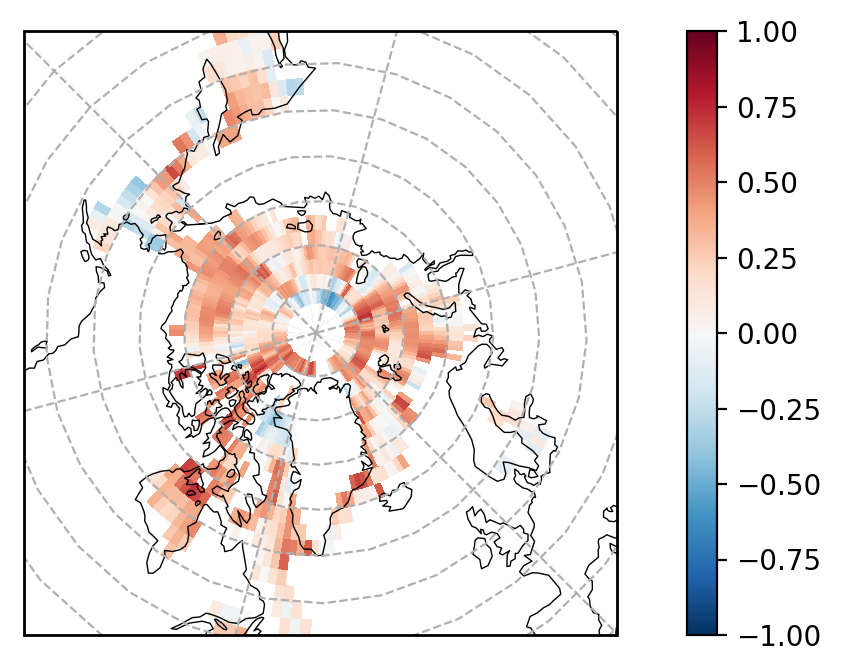

In [210]:
VAR1 = r_sic_2d
LAT = sat_sic.latitude.values
LON = sat_sic.longitude.values
TITLE1 = ''
MAX1 = 1
stipple=None
extent=True
colorbar=True

fig,ax = plt.subplots(1,1, figsize=(9, 4), subplot_kw = proj)

cmap = plt.cm.RdBu_r
cmap.set_bad('gray',np.nan)

var1, lon1 = add_cyclic_point(VAR1, coord=LON)
new_lon2d, new_lat2d = np.meshgrid(lon1, LAT)
if extent is True: 
    ax.set_extent([-150, 140, 50, 90], crs=ccrs.PlateCarree())
ax.gridlines(linestyle='--')
ax.add_feature(cfeature.LAND, facecolor=(1, 1, 1))
cs = ax.pcolormesh(new_lon2d, new_lat2d, var1, 
                   vmin=-MAX1, vmax=MAX1, cmap=cmap, 
                   transform=ccrs.PlateCarree())

#ax.imshow(stip_nan, cmap=cmap)
#ax.imshow(stip, interpolation='nearest', cmap=cmap)

if not stipple is None: 
    print('yes')
    stip1, lon1 = add_cyclic_point(stipple, coord=LON)
    cs2 = ax.contourf(new_lon2d, new_lat2d, stip1, levels=[0,0.5,1.5,2.5], cmap=plt.cm.Greys,
                      transform=ccrs.PlateCarree())

ax.coastlines(resolution='110m', linewidth=0.5)
if colorbar is True:
    plt.colorbar(cs, ax=ax)
ax.set_title(TITLE1)

## Differences in Variance?

In [212]:
var_recon = np.var(sic_lalo_itmn_ccsm4_2d,axis=0)
var_sat = np.var(sat_sic_an_2d*100,axis=0)
var_recon.max()

133.41983096345265

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/cartopy/util.py:102: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  new_data = ma.concatenate((data, data[slicer]), axis=axis)


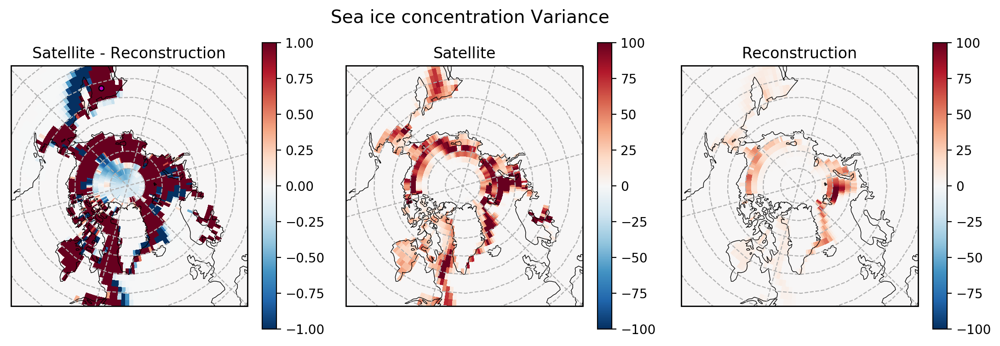

In [214]:
var_diff = np.reshape(var_sat - var_recon,(91,180))
var_sat = np.reshape(var_sat,(91,180))
var_recon = np.reshape(var_recon,(91,180))

fig,ax = plt.subplots(1,3, figsize=(12, 4), subplot_kw = proj)

cs = sub_arctic_plot(fig,ax[0],var_sat-var_recon,sat_sic.latitude.values,
                     sat_sic.longitude.values,'Satellite - Reconstruction',1)
cs1 = sub_arctic_plot(fig,ax[1],var_sat,sat_sic.latitude.values,sat_sic.longitude.values,'Satellite',100)
cs1 = sub_arctic_plot(fig,ax[2],var_recon,sat_sic.latitude.values,sat_sic.longitude.values,'Reconstruction',100)

fig.suptitle('Sea ice concentration Variance', fontsize=14,x=0.43)
plt.tight_layout(rect=(0,0.05,0.92,0.94))

ax[0].scatter(sat_sic.longitude.values[lon_int],sat_sic.latitude.values[lat_int],color='m',
              transform=ccrs.PlateCarree(),marker='o',edgecolors='k',s=15)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = '.png'
#plt.savefig(savedir+savename)

In [155]:
np.var(sat_sic_an[:,85,100]*100),np.var(sic_lalo_itmn_ccsm4[:,85,100])

(0.18573299195420098, 0.5839204436404685)

## Spatial Correlation?

In [203]:
spat_r_sic = np.zeros(sic_lalo_itmn_ccsm4_2d.shape[0])
spat_r2_sic = np.zeros(sic_lalo_itmn_ccsm4_2d.shape[0])
spat_ce_sic = np.zeros(sic_lalo_itmn_ccsm4_2d.shape[0])

for t in range(sat_sic_an_2d.shape[0]):
    spat_r_sic[t],spat_r2_sic[t],_ = kbstats.corr_timeseries(sat_sic_an_2d[t,:]*100,sic_lalo_itmn_ccsm4_2d[t,:])
    spat_ce_sic[t]= kbstats.coefficient_efficiency(sat_sic_an_2d[t,:]*100,sic_lalo_itmn_ccsm4_2d[t,:])

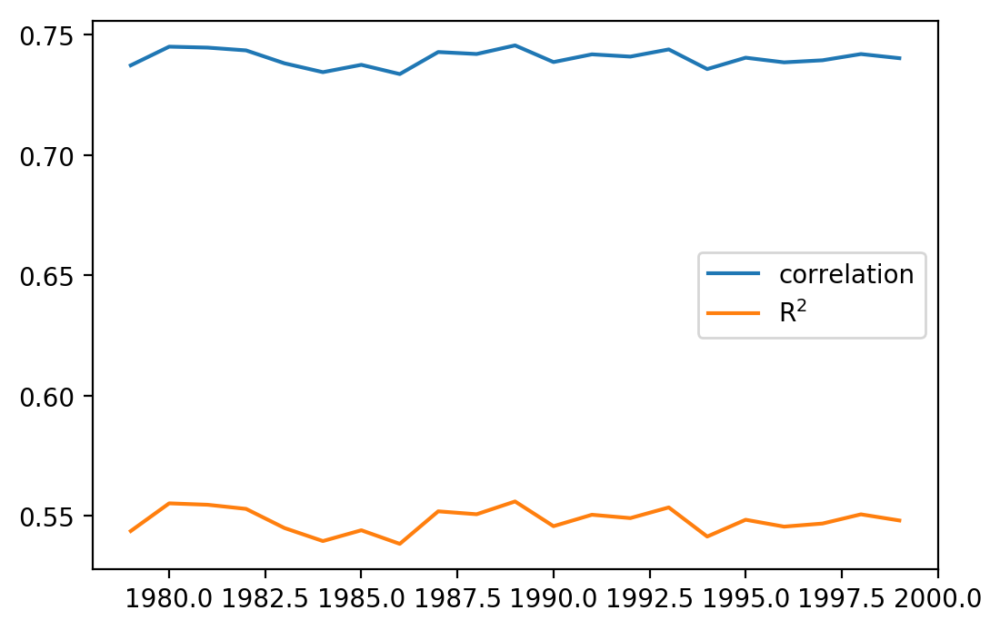

In [221]:
plt.plot(np.arange(1979,2000,1),spat_r_sic, label = 'correlation')
plt.plot(np.arange(1979,2000,1),spat_r_sic**2,label = 'R$^2$')
#plt.plot(np.arange(1979,2000,1),spat_ce_sic, label ='CE')
plt.legend()

In [37]:
def sub_arctic_plot_test(fig,ax,VAR1,LAT,LON,TITLE1,MAX1,colorbar=True,extent=True):
    var1, lon1 = add_cyclic_point(VAR1, coord=LON)
    new_lon2d, new_lat2d = np.meshgrid(lon1, LAT)
    if extent is True: 
        ax.set_extent([-150, 140, 50, 90], crs=ccrs.PlateCarree())
    ax.gridlines(linestyle='--')
    ax.add_feature(cfeature.LAND, facecolor=(1, 1, 1))
    cs = ax.pcolormesh(new_lon2d, new_lat2d, var1, 
                       vmin=-MAX1, vmax=MAX1, cmap=plt.cm.RdBu_r, 
                       transform=ccrs.PlateCarree())
    ax.coastlines(resolution='110m', linewidth=0.5)
    if colorbar is True:
        plt.colorbar(cs, ax=ax)
    ax.set_title(TITLE1)
    
    return cs

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray_test/lib/python3.6/site-packages/cartopy/util.py:102: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  new_data = ma.concatenate((data, data[slicer]), axis=axis)


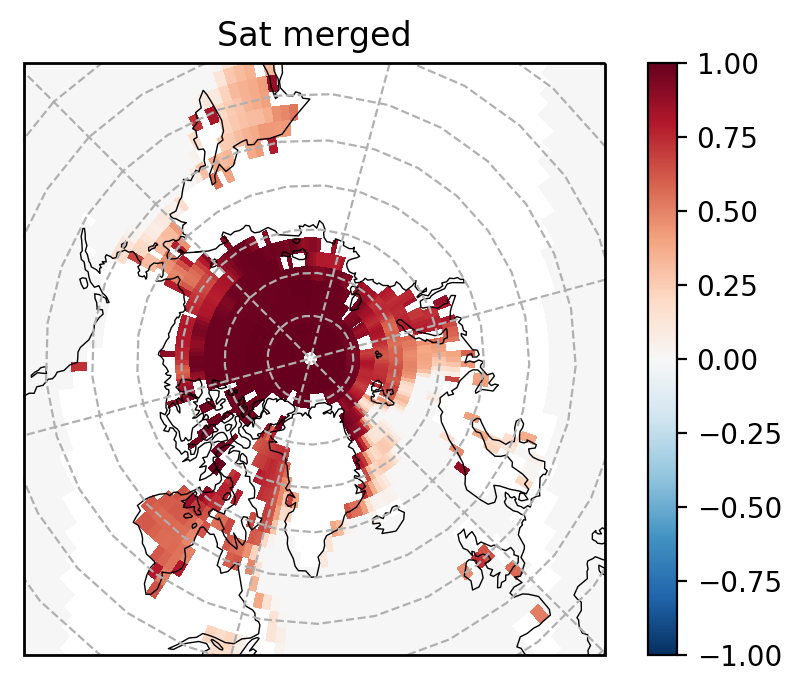

In [38]:
fig,ax = plt.subplots(1,1, figsize=(5, 4), subplot_kw = proj)

cs = sub_arctic_plot_test(fig,ax,sat_sic_merged[0,:,:],sat_ds.lat.values,
                     sat_ds.lon.values,'Sat merged',1.0)

# ax[1].scatter(sat_ds.lon.values[82],sat_ds.lat.values[80],
#               transform=ccrs.PlateCarree(),marker='o',edgecolors='m',s=15)

#fig.suptitle('Sea ice concentration: Satellite vs Reconstruction', fontsize=14,x=0.43)
plt.tight_layout(rect=(0,0.05,0.92,0.94))

In [ ]:
mask = np.empty([nlat,nlon])
for xx in np.arange(0,nlon,1):
    for yy in np.arange(0,nlat,1):
        mask[yy,xx] = m.is_land(LON[xx], LAT[yy])
mask[mask == 0] = 'nan'